In [1]:
import cv2
import numpy as np
import os
import pandas as pd
import random
from collections import Counter
from matplotlib import pyplot as plt

REFERENCE_DIR = "./reference_set"
TARGET_DIR = "./target_set"

In [2]:
def crop_coin_from_circle(img_color, circle, padding=1.15):
    x, y, r = map(int, circle)

    R = int(r * padding)

    h, w = img_color.shape[:2]

    x1 = max(0, x - R)
    y1 = max(0, y - R)
    x2 = min(w, x + R)
    y2 = min(h, y + R)

    crop = img_color[y1:y2, x1:x2].copy()

    return crop


def normalize_coin_crop(coin_crop, size=160):
    gray = cv2.cvtColor(coin_crop, cv2.COLOR_BGR2GRAY)

    gray = cv2.resize(gray, (size, size))

    mask = np.zeros((size, size), dtype=np.uint8)
    cv2.circle(mask, (size // 2, size // 2), int(size * 0.47), 255, -1)

    gray = cv2.bitwise_and(gray, gray, mask=mask)

    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )
    gray = clahe.apply(gray)

    # gray = cv2.GaussianBlur(gray, (3, 3), 1.5)
    gray = cv2.bilateralFilter(
        gray,
        d=9,
        sigmaColor=85,
        sigmaSpace=85
    )

    edges = cv2.Canny(gray, 25, 80)

    edges = cv2.bitwise_and(edges, edges, mask=mask)

    return edges


def rotate_image(img, angle):
    h, w = img.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)

    rotated = cv2.warpAffine(
        img,
        M,
        (w, h),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=0
    )

    return rotated


def build_coin_templates(reference_dir, size=160, rotation_angle=15, padding=1):
    templates = {}

    for filename in os.listdir(reference_dir):

        if not filename.lower().endswith(".jpg"):
            continue

        coin_value = filename.replace(".jpg", "")
        image_path = os.path.join(reference_dir, filename)

        img_color = cv2.imread(image_path)

        img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

        img_gray = cv2.bilateralFilter(
            img_gray,
            d=9,
            sigmaColor=85,
            sigmaSpace=85
        )

        circles = cv2.HoughCircles(
            img_gray,
            cv2.HOUGH_GRADIENT,
            dp=1,
            minDist=50,
            param1=80,
            param2=40,
            minRadius=30,
            maxRadius=180
        )

        if circles is None:
            print(f"No reference circle found for {filename}")
            continue

        circles = np.uint16(np.around(circles))
        x, y, r = circles[0][0]

        crop = crop_coin_from_circle(img_color, (x, y, r), padding=padding)
        normalized = normalize_coin_crop(crop, size=size)

        rotated_versions = []

        for angle in range(0, 360, rotation_angle):
            rotated_versions.append(rotate_image(normalized, angle))

        templates[coin_value] = rotated_versions

        print(f"{coin_value}: template created with {len(rotated_versions)} rotations")

    return templates

In [3]:
def visualize_template_creation(reference_image_path, size=160, padding=1.15):
    img_color = cv2.imread(reference_image_path)
    img_rgb = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

    img_gray_filtered = cv2.bilateralFilter(
        img_gray,
        d=7,
        sigmaColor=85,
        sigmaSpace=85
    )

    circles = cv2.HoughCircles(
        img_gray_filtered,
        cv2.HOUGH_GRADIENT,
        dp=1,
        minDist=50,
        param1=80,
        param2=40,
        minRadius=30,
        maxRadius=180
    )

    if circles is None:
        print("No circle detected in reference image.")
        return

    circles = np.uint16(np.around(circles))
    x, y, r = circles[0][0]

    circle_vis = img_rgb.copy()
    cv2.circle(circle_vis, (x, y), r, (0, 255, 0), 3)
    cv2.circle(circle_vis, (x, y), 4, (255, 0, 0), -1)

    crop = crop_coin_from_circle(img_color, (x, y, r))

    gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
    resized = cv2.resize(gray_crop, (size, size))

    mask = np.zeros((size, size), dtype=np.uint8)
    cv2.circle(mask, (size // 2, size // 2), int(size * 0.47), 255, -1)

    masked = cv2.bitwise_and(resized, resized, mask=mask)

    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )
    enhanced = clahe.apply(masked)

    blurred = cv2.GaussianBlur(enhanced, (3, 3), 0)

    edges = cv2.Canny(blurred, 50, 150)
    edges = cv2.bitwise_and(edges, edges, mask=mask)

    rotated_0 = rotate_image(edges, 0)
    rotated_45 = rotate_image(edges, 45)
    rotated_90 = rotate_image(edges, 90)
    rotated_135 = rotate_image(edges, 135)

    steps = [
        ("Original reference image", img_rgb),
        ("Detected reference circle", circle_vis),
        ("Cropped coin", cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)),
        ("Resized grayscale crop", resized),
        ("Circular mask", mask),
        ("Masked coin", masked),
        ("CLAHE enhanced", enhanced),
        ("Blurred", blurred),
        ("Canny edges = final template", edges),
        ("Rotated template 0°", rotated_0),
        ("Rotated template 45°", rotated_45),
        ("Rotated template 90°", rotated_90),
        ("Rotated template 135°", rotated_135)
    ]

    plt.figure(figsize=(18, 12))

    for i, (title, image) in enumerate(steps):
        plt.subplot(3, 5, i + 1)

        if len(image.shape) == 2:
            plt.imshow(image, cmap="gray")
        else:
            plt.imshow(image)

        plt.title(title)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

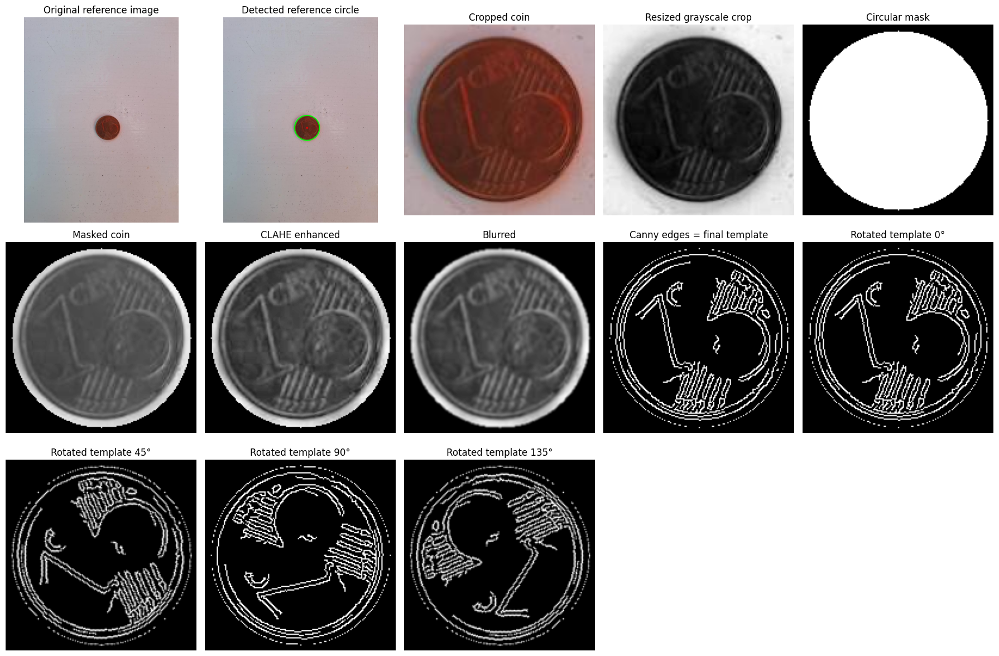

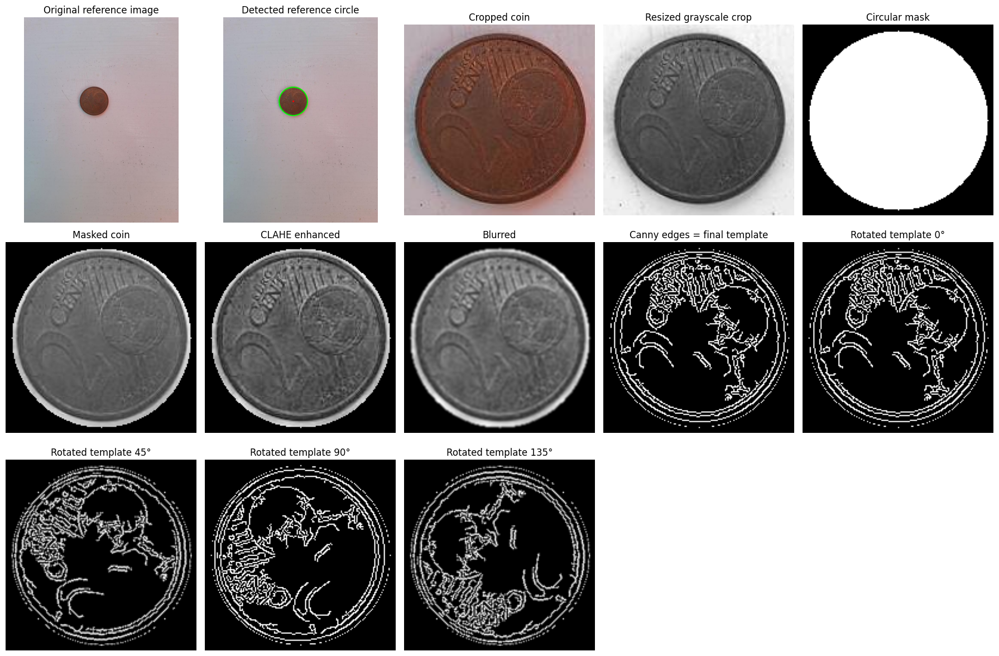

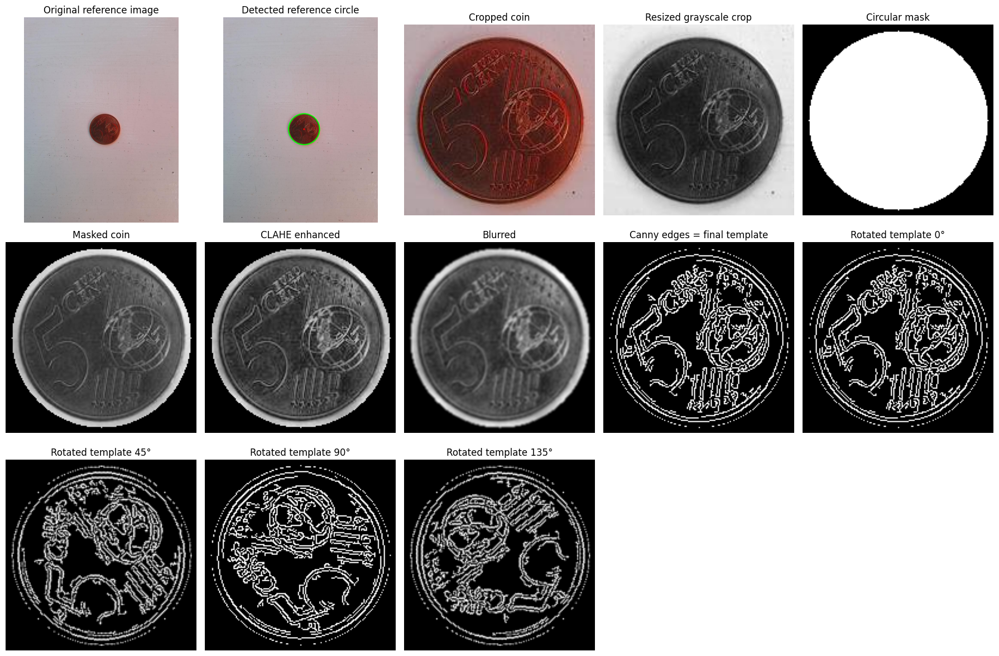

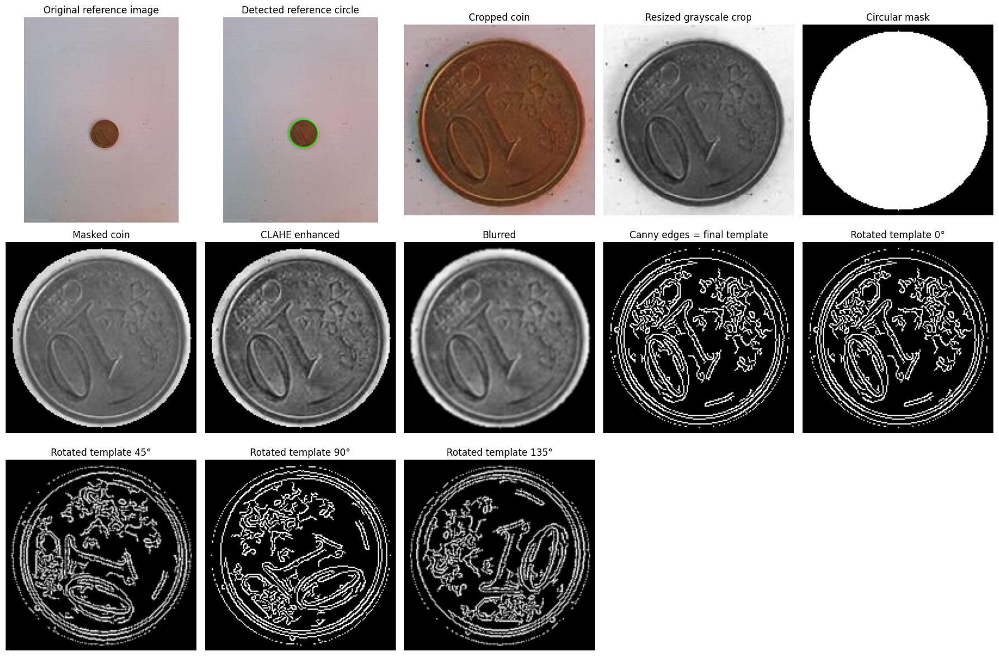

In [ ]:
visualize_template_creation("./reference_set/1cent.jpg")
visualize_template_creation("./reference_set/2cent.jpg")
visualize_template_creation("./reference_set/5cent.jpg")
visualize_template_creation("./reference_set/10cent.jpg")
visualize_template_creation("./reference_set/20cent.jpg")
visualize_template_creation("./reference_set/50cent.jpg")
visualize_template_creation("./reference_set/1euro.jpg")
visualize_template_creation("./reference_set/2euro.jpg")

# TARGET COINS CIRCLES DETECTION

In [5]:
def filter_overlapping_circles(circles, overlap_threshold=0.6):
    """
    Remove duplicate circles detected on the same coin.
    Keeps one circle when centers are close and radii are similar.
    """

    if circles is None:
        return None

    circles = np.round(circles[0]).astype(np.int32)

    selected_circles = []

    for circle in circles:
        x1, y1, r1 = circle

        duplicate = False

        for selected in selected_circles:
            x2, y2, r2 = selected

            distance = np.sqrt(
                float((x1 - x2) ** 2 + (y1 - y2) ** 2)
            )

            radius_difference = abs(r1 - r2)

            # Same coin if centers are close
            # and radii are not extremely different
            if (
                distance < overlap_threshold * max(r1, r2)
                and radius_difference < 0.35 * max(r1, r2)
            ):
                duplicate = True
                break

        if not duplicate:
            selected_circles.append(circle)

    if len(selected_circles) == 0:
        return None

    return np.array([selected_circles], dtype=np.uint16)

In [6]:
def remove_inner_circles(circles, margin=5):
    """
    Removes circles that are inside larger circles.
    Useful when Hough detects multiple nested circles on the same coin.
    """

    if circles is None:
        return None

    circles = np.round(circles[0]).astype(np.int32)

    keep_circles = []

    for i, c1 in enumerate(circles):
        x1, y1, r1 = c1
        inside_another = False

        for j, c2 in enumerate(circles):
            if i == j:
                continue

            x2, y2, r2 = c2

            # Only compare against larger circles
            if r2 <= r1:
                continue

            distance = np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)

            # If the smaller circle is inside the larger circle
            if distance + r1 <= r2 + margin:
                inside_another = True
                break

        if not inside_another:
            keep_circles.append(c1)

    if len(keep_circles) == 0:
        return None

    return np.array([keep_circles], dtype=np.uint16)

In [7]:
def extract_target_features(image_path):

    img_color = cv2.imread(image_path)

    img_gray = cv2.cvtColor(
        img_color,
        cv2.COLOR_BGR2GRAY
    )

    img_gray = cv2.bilateralFilter(
        img_gray,
        d=7,
        sigmaColor=85,
        sigmaSpace=85
    )

    # Median filter removes salt-and-pepper noise better
    img_gray = cv2.medianBlur(img_gray, 11)

    # CLAHE improves local contrast
    clahe = cv2.createCLAHE(
        clipLimit=1.25,
        tileGridSize=(8, 8)
    )

    img_gray = clahe.apply(img_gray)

    # Slight Gaussian smoothing
    img_gray = cv2.GaussianBlur(
        img_gray, 
        (5, 5),
        1.5)

    circles = cv2.HoughCircles(
        img_gray,
        cv2.HOUGH_GRADIENT,
        dp=1,
        minDist=10,
        param1=80,
        param2=40,
        minRadius=30,
        maxRadius=180
    )

    # Remove duplicate overlapping circles
    circles = filter_overlapping_circles(circles)
    circles = remove_inner_circles(circles, margin=5)

    combined_mask = np.zeros_like(img_gray)

    if circles is not None:

        circles = np.uint16(np.around(circles))

        for circle in circles[0]:

            x, y, r = circle

            cv2.circle(
                combined_mask,
                (x, y),
                r,
                255,
                -1
            )

    # kp, des = sift.detectAndCompute(
    #     img_gray,
    #     combined_mask
    # )

    return (
        img_color, # Colored Image
        img_gray, 
        combined_mask, 
        # kp, # Keypoints
        # des, # Descriptor
        circles # Coins
    )

# TARGET COINS CIRLCE CROP AND PREPROCESSING

In [68]:
def crop_target_coins_from_detected_circles(image_path, padding=1.15):
    img_color, img_gray, combined_mask, circles = extract_target_features(image_path)

    coin_crops = []

    if circles is None:
        print("No coins detected.")
        return img_color, coin_crops

    for circle in circles[0]:
        x, y, r = map(int, circle)

        crop = crop_coin_from_circle(
            img_color,
            (x, y, r),
            padding=padding
        )

        coin_crops.append({
            "crop": crop,
            "circle": (x, y, r)
        })

    return img_color, coin_crops

In [69]:
def apply_circular_mask_to_crop(coin_crop, size=160):
    crop_resized = cv2.resize(coin_crop, (size, size))

    mask = np.zeros((size, size), dtype=np.uint8)
    cv2.circle(
        mask,
        (size // 2, size // 2),
        int(size * 0.47),
        255,
        -1
    )

    masked_crop = cv2.bitwise_and(
        crop_resized,
        crop_resized,
        mask=mask
    )

    return masked_crop

In [70]:
def normalize_target_coin_crop(coin_crop, size=160):

    gray = cv2.cvtColor(coin_crop, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (size, size))

    mask = np.zeros((size, size), dtype=np.uint8)
    cv2.circle(
        mask,
        (size // 2, size // 2),
        int(size * 0.47),
        255,
        -1
    )

    gray = cv2.bitwise_and(gray, gray, mask=mask)

    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )
    gray = clahe.apply(gray)

    gray = cv2.bilateralFilter(
        gray,
        d=5,
        sigmaColor=50,
        sigmaSpace=50
    )

    edges = cv2.Canny(
        gray,
        100,
        200
    )

    edges = cv2.bitwise_and(edges, edges, mask=mask)

    return edges, gray

In [71]:
def visualize_detected_coins_in_sample_images(
    target_dir,
    num_images=5,
    max_coins_per_image=None,
    padding=1.05,
    normalized_size=160,
    random_seed=42
):

    if random_seed is not None:
            random.seed(random_seed)

    image_files = [
        f for f in os.listdir(target_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    sampled_files = random.sample(
        image_files,
        min(num_images, len(image_files))
    )

    for filename in sampled_files:
        image_path = os.path.join(target_dir, filename)

        img_color, img_gray, combined_mask, circles = extract_target_features(image_path)

        if circles is None or len(circles[0]) == 0:
            print(f"{filename}: no coins detected")
            continue

        coin_list = []

        for circle in circles[0]:
            x, y, r = map(int, circle)

            crop = crop_coin_from_circle(
                img_color,
                (x, y, r),
                padding=padding
            )

            masked_crop = apply_circular_mask_to_crop(
                crop,
                size=normalized_size
            )

            normalized, denoised_gray = normalize_target_coin_crop(
                crop,
                size=normalized_size
            )

            coin_list.append({
                "crop": crop,
                "masked_crop": masked_crop,
                "normalized": normalized,
                "denoised_gray": denoised_gray,
                "circle": (x, y, r)
            })

        if max_coins_per_image is not None:
            coin_list = coin_list[:max_coins_per_image]

        n = len(coin_list)

        plt.figure(figsize=(3 * n, 13))

        for i, coin_data in enumerate(coin_list):
            crop_rgb = cv2.cvtColor(
                coin_data["crop"],
                cv2.COLOR_BGR2RGB
            )

            masked_rgb = cv2.cvtColor(
                coin_data["masked_crop"],
                cv2.COLOR_BGR2RGB
            )

            normalized = coin_data["normalized"]
            denoised_gray = coin_data["denoised_gray"]
            x, y, r = coin_data["circle"]

            plt.subplot(4, n, i + 1)
            plt.imshow(crop_rgb)
            plt.title(f"Original crop\nr={r}")
            plt.axis("off")

            plt.subplot(4, n, i + 1 + n)
            plt.imshow(masked_rgb)
            plt.title("Masked crop")
            plt.axis("off")

            plt.subplot(4, n, i + 1 + 2 * n)
            plt.imshow(denoised_gray, cmap="gray")
            plt.title("Denoised")
            plt.axis("off")

            plt.subplot(4, n, i + 1 + 3 * n)
            plt.imshow(normalized, cmap="gray")
            plt.title("Normalized edges")
            plt.axis("off")

        plt.suptitle(
            f"{filename} — detected coins: {len(coin_list)}",
            fontsize=14
        )

        plt.tight_layout()
        plt.show()

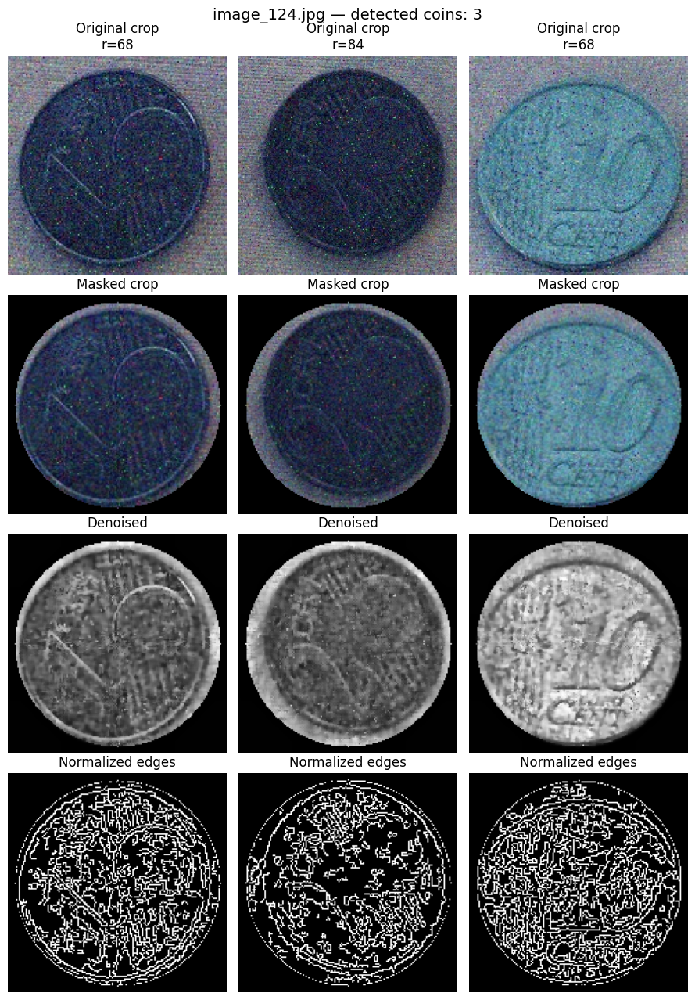

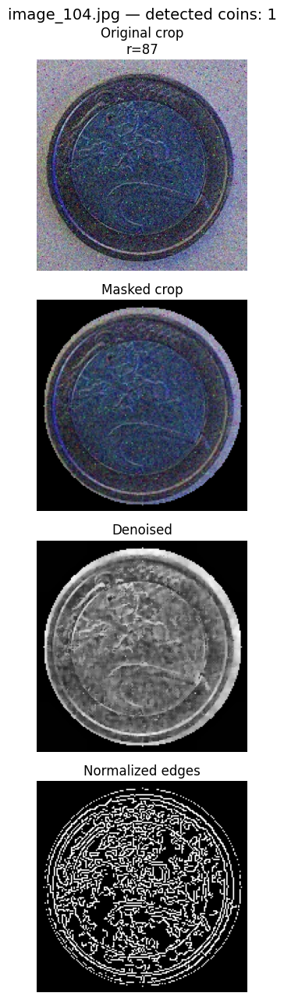

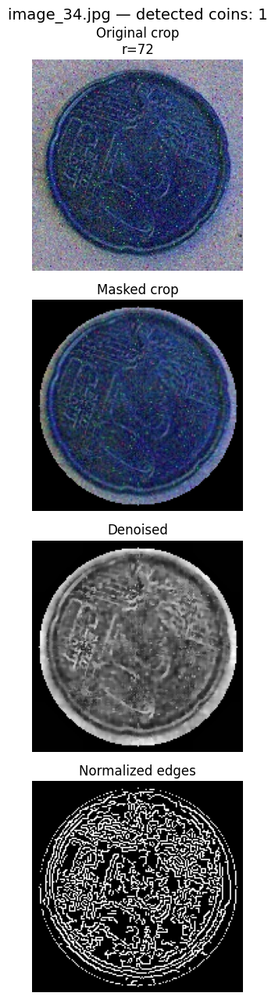

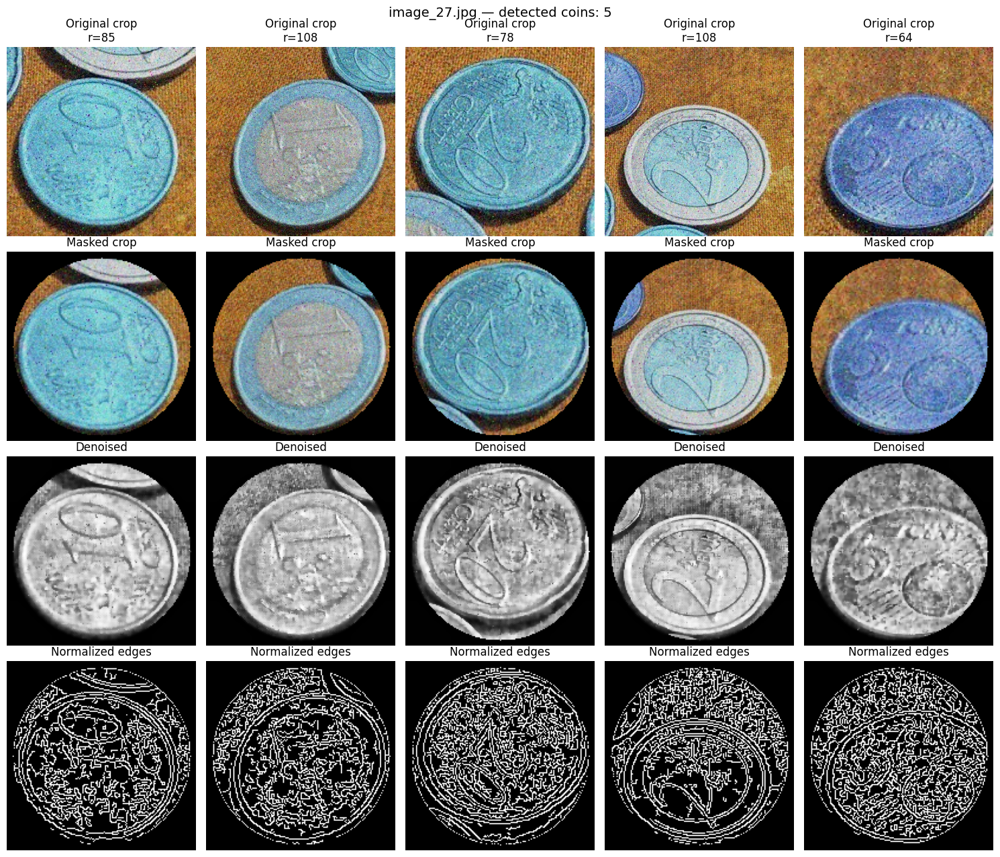

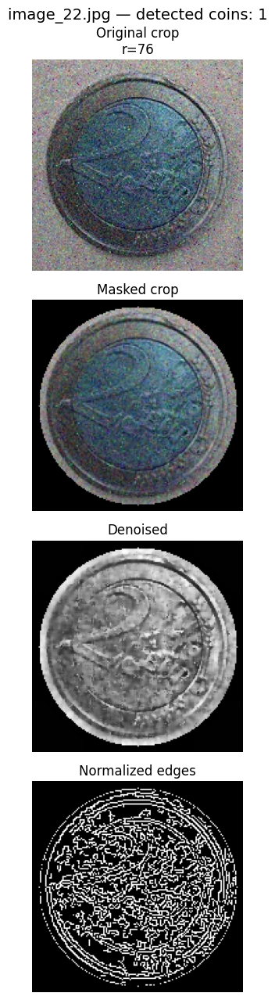

In [14]:
visualize_detected_coins_in_sample_images(
    target_dir="./target_set",
    num_images=5,
    max_coins_per_image=None
)

# CLASSIFICATION OF THE TARGET COINS

In [142]:
COIN_COLOR_GROUPS = {
    "copper": ["1cent", "2cent", "5cent"],
    "gold": ["10cent", "20cent", "50cent"],
    "bicolor": ["1euro", "2euro"]
}


def circular_ring_masks(size=160):
    yy, xx = np.ogrid[:size, :size]
    cx, cy = size // 2, size // 2

    dist = np.sqrt((xx - cx) ** 2 + (yy - cy) ** 2)

    inner = dist <= size * 0.23
    outer = (dist >= size * 0.30) & (dist <= size * 0.46)
    full = dist <= size * 0.46

    return inner, outer, full


def gray_world_normalize(rgb):
    rgb = rgb.astype(np.float32)

    mean_channels = rgb.reshape(-1, 3).mean(axis=0)
    mean_gray = mean_channels.mean()

    rgb = rgb * (mean_gray / (mean_channels + 1e-6))
    rgb = np.clip(rgb, 0, 255).astype(np.uint8)

    return rgb

# def color_signature_from_crop(coin_crop):
#     hsv = cv2.cvtColor(coin_crop, cv2.COLOR_BGR2HSV)

#     h, w = hsv.shape[:2]
#     cy, cx = h // 2, w // 2

#     yy, xx = np.ogrid[:h, :w]
#     dist = np.sqrt((xx - cx) ** 2 + (yy - cy) ** 2)

#     mask = dist <= min(h, w) * 0.45

#     pixels = hsv[mask]

#     hue = pixels[:, 0]
#     sat = pixels[:, 1]

#     # ignore very low saturation pixels because hue is unreliable there
#     valid = sat > 35

#     hue = hue[valid]
#     sat = sat[valid]

#     if len(hue) == 0:
#         return np.zeros(18, dtype=np.float32)

#     hist = cv2.calcHist(
#         [hue],
#         [0],
#         None,
#         [18],
#         [0, 180]
#     ).flatten()

#     # weight hue histogram by saturation
#     hist = hist.astype(np.float32)
#     hist = hist / (hist.sum() + 1e-6)

#     sat_mean = np.mean(sat) / 255.0
#     sat_std = np.std(sat) / 255.0

#     signature = np.concatenate([
#         hist,
#         np.array([sat_mean, sat_std], dtype=np.float32)
#     ])

#     return signature

def color_signature_from_crop(coin_crop):
    coin_crop = cv2.resize(coin_crop, (160, 160))

    hsv = cv2.cvtColor(coin_crop, cv2.COLOR_BGR2HSV)

    h, w = hsv.shape[:2]
    cy, cx = h // 2, w // 2

    yy, xx = np.ogrid[:h, :w]
    dist = np.sqrt((xx - cx) ** 2 + (yy - cy) ** 2)

    center_mask = dist <= 160 * 0.23
    ring_mask = (dist >= 160 * 0.30) & (dist <= 160 * 0.46)
    full_mask = dist <= 160 * 0.46

    def hsv_hist(mask):
        pixels = hsv[mask]

        hue = pixels[:, 0]
        sat = pixels[:, 1]

        valid = sat > 35
        hue = hue[valid]
        sat = sat[valid]

        if len(hue) == 0:
            return np.zeros(20, dtype=np.float32)

        hist = cv2.calcHist(
            [hue],
            [0],
            None,
            [18],
            [0, 180]
        ).flatten().astype(np.float32)

        hist = hist / (hist.sum() + 1e-6)

        sat_mean = np.mean(sat) / 255.0
        sat_std = np.std(sat) / 255.0

        return np.concatenate([
            hist,
            np.array([sat_mean, sat_std], dtype=np.float32)
        ])

    center_signature = hsv_hist(center_mask)
    ring_signature = hsv_hist(ring_mask)
    full_signature = hsv_hist(full_mask)

    return np.concatenate([
        full_signature,
        center_signature,
        ring_signature,
        center_signature - ring_signature
    ])

def build_color_profiles(reference_dir):
    color_profiles = {}

    for filename in os.listdir(reference_dir):

        if not filename.lower().endswith(".jpg"):
            continue

        coin_value = filename.replace(".jpg", "")
        image_path = os.path.join(reference_dir, filename)

        img_color = cv2.imread(image_path)

        img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

        img_gray = cv2.bilateralFilter(
            img_gray,
            d=9,
            sigmaColor=85,
            sigmaSpace=85
        )

        circles = cv2.HoughCircles(
            img_gray,
            cv2.HOUGH_GRADIENT,
            dp=1,
            minDist=50,
            param1=80,
            param2=40,
            minRadius=30,
            maxRadius=180
        )

        if circles is None:
            print(f"No color profile circle found for {filename}")
            continue

        circles = np.uint16(np.around(circles))
        x, y, r = circles[0][0]

        crop = crop_coin_from_circle(img_color, (x, y, r), padding=1.05)

        color_profiles[coin_value] = color_signature_from_crop(crop)

    return color_profiles

In [138]:
def estimate_color_group(coin_crop, color_profiles, confidence_margin=12):
    target_signature = color_signature_from_crop(coin_crop)

    group_distances = {}

    for group_name, labels in COIN_COLOR_GROUPS.items():

        distances = []

        for label in labels:
            if label not in color_profiles:
                continue

            distance = np.linalg.norm(
                target_signature - color_profiles[label]
            )

            distances.append(distance)

        if len(distances) > 0:
            group_distances[group_name] = min(distances)

    if len(group_distances) == 0:
        return "uncertain", None

    sorted_groups = sorted(
        group_distances.items(),
        key=lambda x: x[1]
    )

    best_group, best_distance = sorted_groups[0]

    if len(sorted_groups) > 1:
        second_distance = sorted_groups[1][1]

        if second_distance - best_distance < confidence_margin:
            return "uncertain", group_distances

    return best_group, group_distances

In [136]:
def classify_coin_by_template(
    coin_crop,
    templates
):
    edges = normalize_coin_crop(coin_crop)

    best_label = None
    best_score = -1

    for coin_value in templates:

        for template in templates[coin_value]:

            result = cv2.matchTemplate(
                edges,
                template,
                cv2.TM_CCOEFF_NORMED
            )

            score = result.max()

            if score > best_score:
                best_score = score
                best_label = coin_value

    return best_label, best_score

# def classify_coin_by_template_with_color(
#     coin_crop,
#     templates,
#     color_profiles=None,
#     color_weight=0.08,
#     color_scale=35
# ):
#     edges = normalize_coin_crop(coin_crop)

#     target_color_signature = None
#     if color_profiles is not None:
#         target_color_signature = color_signature_from_crop(coin_crop)

#     best_label = None
#     best_template_score = -1
#     best_final_score = -1
#     best_color_similarity = 0

#     for coin_value in templates:

#         # best template score for this coin type
#         coin_best_template_score = -1

#         for template in templates[coin_value]:

#             result = cv2.matchTemplate(
#                 edges,
#                 template,
#                 cv2.TM_CCOEFF_NORMED
#             )

#             score = result.max()

#             if score > coin_best_template_score:
#                 coin_best_template_score = score

#         # soft color similarity
#         color_similarity = 0

#         if target_color_signature is not None and coin_value in color_profiles:

#             color_distance = np.linalg.norm(
#                 target_color_signature - color_profiles[coin_value]
#             )

#             color_similarity = np.exp(
#                 -color_distance / color_scale
#             )

#         final_score = (
#             coin_best_template_score
#             + color_weight * color_similarity
#         )

#         if final_score > best_final_score:
#             best_final_score = final_score
#             best_template_score = coin_best_template_score
#             best_color_similarity = color_similarity
#             best_label = coin_value

#     return best_label, best_template_score, best_final_score, best_color_similarity

In [137]:
def coin_group_from_label(label):
    if label in ["1cent", "2cent", "5cent"]:
        return "copper"
    if label in ["10cent", "20cent", "50cent"]:
        return "gold"
    if label in ["1euro", "2euro"]:
        return "bicolor"
    return "unknown"


# def classify_coin_by_template_with_color(
#     coin_crop,
#     templates,
#     color_profiles=None,
#     color_weight=0.10,
#     color_scale=45
# ):
#     edges = normalize_coin_crop(coin_crop)

#     target_signature = None
#     group_scores = {}

#     if color_profiles is not None:
#         target_signature = color_signature_from_crop(coin_crop)

#         for group_name, labels in COIN_COLOR_GROUPS.items():
#             distances = []

#             for label in labels:
#                 if label in color_profiles:
#                     distance = np.linalg.norm(
#                         target_signature - color_profiles[label]
#                     )
#                     distances.append(distance)

#             if len(distances) > 0:
#                 best_distance = min(distances)
#                 group_scores[group_name] = np.exp(-best_distance / color_scale)

#     best_label = None
#     best_template_score = -1
#     best_final_score = -1
#     best_color_score = 0

#     for coin_value in templates:

#         coin_best_template_score = -1

#         for template in templates[coin_value]:

#             result = cv2.matchTemplate(
#                 edges,
#                 template,
#                 cv2.TM_CCOEFF_NORMED
#             )

#             score = result.max()

#             if score > coin_best_template_score:
#                 coin_best_template_score = score

#         group = coin_group_from_label(coin_value)
#         color_score = group_scores.get(group, 0)

#         final_score = coin_best_template_score + color_weight * color_score

#         if final_score > best_final_score:
#             best_final_score = final_score
#             best_template_score = coin_best_template_score
#             best_color_score = color_score
#             best_label = coin_value

#     return best_label, best_template_score, best_final_score, best_color_score

def classify_coin_by_template_with_color(
    coin_crop,
    templates,
    color_profiles=None,
    color_weight=0.12,
    color_scale=0.45
):
    edges = normalize_coin_crop(coin_crop)

    target_signature = None
    group_scores = {}

    if color_profiles is not None:
        target_signature = color_signature_from_crop(coin_crop)

        for group_name, labels in COIN_COLOR_GROUPS.items():
            distances = []

            for label in labels:
                if label in color_profiles:
                    distance = np.linalg.norm(
                        target_signature - color_profiles[label]
                    )
                    distances.append(distance)

            if len(distances) > 0:
                best_distance = min(distances)

                group_scores[group_name] = np.exp(
                    -best_distance / color_scale
                )

    best_label = None
    best_template_score = -1
    best_final_score = -1
    best_color_score = 0

    for coin_value in templates:

        coin_best_template_score = -1

        for template in templates[coin_value]:

            result = cv2.matchTemplate(
                edges,
                template,
                cv2.TM_CCOEFF_NORMED
            )

            score = result.max()

            if score > coin_best_template_score:
                coin_best_template_score = score

        group = coin_group_from_label(coin_value)

        color_score = group_scores.get(group, 0)

        final_score = (
            coin_best_template_score
            + color_weight * color_score
        )

        if final_score > best_final_score:
            best_final_score = final_score
            best_template_score = coin_best_template_score
            best_color_score = color_score
            best_label = coin_value

    return best_label, best_template_score, best_final_score, best_color_score

In [143]:
def detect_and_classify_coins_by_number(
    image_path,
    templates,
    color_profiles=None,
    min_score=0.10,
    padding=1
):
    img_color, img_gray, combined_mask, circles = extract_target_features(image_path)

    detections = []

    if circles is None:
        return img_color, detections

    for circle in circles[0]:

        x, y, r = map(int, circle)

        crop = crop_coin_from_circle(
            img_color,
            (x, y, r),
            padding=padding
        )

        label, template_score, final_score, color_similarity = classify_coin_by_template_with_color(
            crop,
            templates,
            color_profiles=color_profiles,
            color_weight=0.20,
            color_scale=0.55
        )

        if final_score  >= min_score:
            detections.append({
                "x": x,
                "y": y,
                "r": r,
                "coin_value": label,
                "template_score": template_score,
                "final_score": final_score,
                "color_similarity": color_similarity
            })

    return img_color, detections

In [99]:
def label_to_cent(label):

    mapping = {
        "1cent": 1,
        "2cent": 2,
        "5cent": 5,
        "10cent": 10,
        "20cent": 20,
        "50cent": 50,
        "1euro": 100,
        "2euro": 200
    }

    return mapping[label]

def parse_ground_truth(row):

    composition = str(row["Composition of coins (in cent)"])

    values = [
        int(x.strip())
        for x in composition.split(",")
    ]

    return Counter(values)

def detections_to_counts(detections):

    predicted = []

    for d in detections:
        predicted.append(
            label_to_cent(
                d["coin_value"]
            )
        )

    return Counter(predicted)

def compute_accuracy(
    predicted_counts,
    true_counts
):

    correct = 0
    total = sum(
        true_counts.values()
    )

    for coin in true_counts:

        correct += min(
            predicted_counts.get(coin, 0),
            true_counts[coin]
        )

    return correct / total

def compute_detection_accuracy(
    detections,
    true_counts
):

    true_num_coins = sum(true_counts.values())
    detected_num_coins = len(detections)

    if true_num_coins == 0:
        return 0

    return min(
        detected_num_coins,
        true_num_coins
    ) / true_num_coins

In [100]:
def evaluate_dataset(
    image_dir,
    templates,
    csv_path,
    color_profiles,
    min_score=0.10,
    padding=1
):
    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()

    coin_values = [1, 2, 5, 10, 20, 50, 100, 200]

    accuracies = []

    total_detected_value = 0

    total_detected_counts = {
        coin_value: 0
        for coin_value in coin_values
    }

    total_correct_coins = 0
    total_ground_truth_coins = 0

    for _, row in df.iterrows():

        image_name = str(row["Image"]).strip()

        image_path = os.path.join(
            image_dir,
            image_name + ".jpg"
        )

        _, detections = detect_and_classify_coins_by_number(
            image_path,
            templates,
            color_profiles=color_profiles,
            min_score=min_score,
            padding=padding
        )

        predicted_counts = detections_to_counts(detections)
        true_counts = parse_ground_truth(row)

        image_detected_value = sum(
            coin_value * count
            for coin_value, count in predicted_counts.items()
        )

        total_detected_value += image_detected_value

        for coin_value, count in predicted_counts.items():
            total_detected_counts[coin_value] += count

        for coin_value in coin_values:
            predicted = predicted_counts.get(coin_value, 0)
            true = true_counts.get(coin_value, 0)

            total_correct_coins += min(predicted, true)
            total_ground_truth_coins += true

        acc = compute_accuracy(
            predicted_counts,
            true_counts
        )

        accuracies.append(acc)

        print("=" * 60)
        print(f"Image: {image_name}.jpg")
        print(f"Detected coins: {len(detections)}")
        print(f"Detected value: {image_detected_value} cents")
        print(f"Ground truth: {dict(true_counts)}")
        print(f"Predicted:    {dict(predicted_counts)}")
        print(f"Image accuracy: {acc * 100:.2f}%")

    final_accuracy = sum(accuracies) / len(accuracies)

    overall_coin_accuracy = (
        total_correct_coins / total_ground_truth_coins
        if total_ground_truth_coins > 0
        else 0
    )

    print("=" * 60)
    print(f"Average image accuracy: {final_accuracy * 100:.2f}%")
    print(f"Overall coin accuracy: {overall_coin_accuracy * 100:.2f}%")
    print(f"Correctly detected coins: {total_correct_coins}")
    print(f"Total ground truth coins: {total_ground_truth_coins}")

    print("=" * 60)
    print(f"Total detected value: {total_detected_value} cents")
    print(f"Total detected value: €{total_detected_value / 100:.2f}")

    print("\nTotal detected coin counts:")
    for coin_value, count in total_detected_counts.items():
        print(f"{coin_value} cent: {count}")

    # return (
    #     final_accuracy,
    #     overall_coin_accuracy,
    #     total_correct_coins,
    #     total_ground_truth_coins,
    #     total_detected_value,
    #     total_detected_counts
    # )

In [117]:
def visualize_random_coin_detections(
    image_dir,
    templates,
    color_profiles,
    N=5,
    min_score=0.15,
    seed=None,
    padding=1.15,
    normalized_size=160,
    image_path=None
):
    if seed is not None:
        random.seed(seed)

    if image_path is not None:
        selected_paths = [image_path]
    else:
        image_files = [
            f for f in os.listdir(image_dir)
            if f.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        selected_files = random.sample(
            image_files,
            min(N, len(image_files))
        )

        selected_paths = [
            os.path.join(image_dir, filename)
            for filename in selected_files
        ]

    for image_path in selected_paths:
        filename = os.path.basename(image_path)

        img_color, detections = detect_and_classify_coins_by_number(
            image_path,
            templates,
            color_profiles=color_profiles,
            min_score=min_score
        )

        img_rgb = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
        full_img = img_rgb.copy()

        for d in detections:
            x, y, r = d["x"], d["y"], d["r"]
            label = d["coin_value"]
            score = d["template_score"]

            cv2.circle(full_img, (x, y), r, (255, 0, 0), 3)

            cv2.putText(
                full_img,
                f"{label} ({score:.2f})",
                (x - r, y - r - 10),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.7,
                (255, 0, 0),
                2
            )

        print("=" * 70)
        print(f"Image: {filename}")
        print(f"Detected coins: {len(detections)}")

        plt.figure(figsize=(8, 6))
        plt.imshow(full_img)
        plt.axis("off")
        plt.title(f"{filename} - Full detection result")
        plt.show()

        if len(detections) == 0:
            print("No coins detected.")
            continue

        num_coins = len(detections)

        plt.figure(figsize=(4 * num_coins, 12))

        for i, d in enumerate(detections):
            x, y, r = d["x"], d["y"], d["r"]
            label = d["coin_value"]
            score = d["template_score"]

            crop = crop_coin_from_circle(
                img_color,
                (x, y, r),
                padding=padding
            )

            crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

            edges, processed_gray = normalize_target_coin_crop(
                crop,
                size=normalized_size
            )

            edge_overlay = cv2.resize(
                crop_rgb,
                (normalized_size, normalized_size)
            )

            edge_overlay[edges > 0] = [255, 0, 0]

            plt.subplot(3, num_coins, i + 1)
            plt.imshow(crop_rgb)
            plt.axis("off")
            plt.title(
                f"{label}\nscore={score:.4f}\nr={r}",
                fontsize=10
            )

            plt.subplot(3, num_coins, i + 1 + num_coins)
            plt.imshow(processed_gray, cmap="gray")
            plt.axis("off")
            plt.title("Processed gray")

            plt.subplot(3, num_coins, i + 1 + 2 * num_coins)
            plt.imshow(edge_overlay)
            plt.axis("off")
            plt.title("Canny edges overlay")

        plt.suptitle(
            f"Canny edge inspection for {filename}",
            fontsize=14
        )

        plt.tight_layout()
        plt.show()

10cent: template created with 120 rotations
1cent: template created with 120 rotations
1euro: template created with 120 rotations
20cent: template created with 120 rotations
2cent: template created with 120 rotations
2euro: template created with 120 rotations
50cent: template created with 120 rotations
5cent: template created with 120 rotations
Image: image_87.jpg
Detected coins: 1


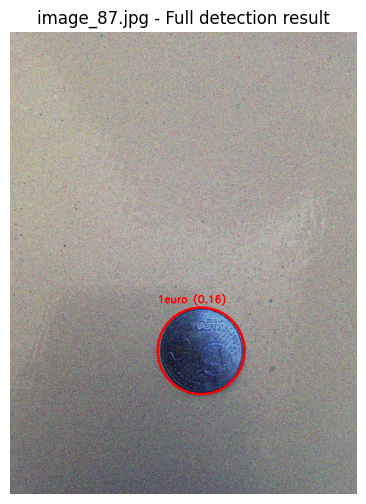

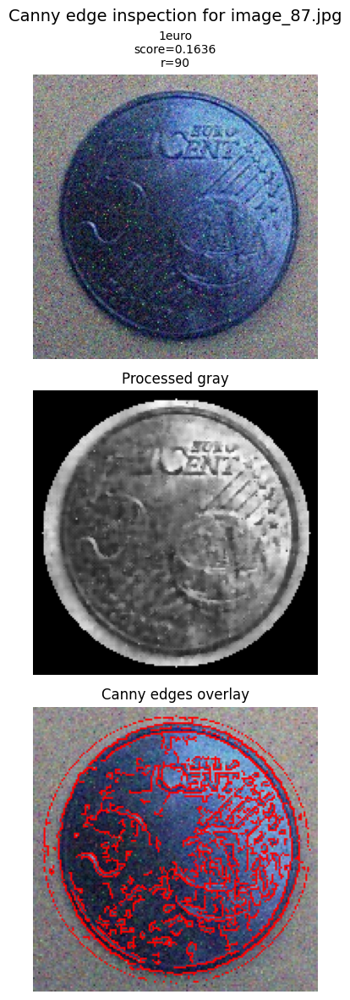

In [144]:
templates = build_coin_templates(REFERENCE_DIR, rotation_angle=3)
color_profiles = build_color_profiles(REFERENCE_DIR)

# visualize_random_coin_detections(
#     TARGET_DIR,
#     templates,
#     N=5,
#     min_score=0.1,
#     seed=42
# )

visualize_random_coin_detections(
    TARGET_DIR,
    templates,
    color_profiles=color_profiles,
    min_score=0.10,
    image_path=os.path.join(TARGET_DIR, "image_87.jpg")
)

In [145]:
# templates = build_coin_templates(
#     REFERENCE_DIR,
#     rotation_angle=3,
#     padding=1
# )

# evaluate_dataset(
#     TARGET_DIR,
#     templates,
#     "Coin values assignment.csv",
#     min_score=0.10,
#     padding=1
# )

templates = build_coin_templates(
    REFERENCE_DIR,
    rotation_angle=3,
    padding=1
)

color_profiles = build_color_profiles(REFERENCE_DIR)

evaluate_dataset(
    TARGET_DIR,
    templates,
    "Coin values assignment.csv",
    color_profiles,
    min_score=0.10,
    padding=1
)

10cent: template created with 120 rotations
1cent: template created with 120 rotations
1euro: template created with 120 rotations
20cent: template created with 120 rotations
2cent: template created with 120 rotations
2euro: template created with 120 rotations
50cent: template created with 120 rotations
5cent: template created with 120 rotations
Image: image_1.jpg
Detected coins: 3
Detected value: 45 cents
Ground truth: {5: 1, 2: 1, 1: 1}
Predicted:    {20: 2, 5: 1}
Image accuracy: 33.33%
Image: image_2.jpg
Detected coins: 1
Detected value: 5 cents
Ground truth: {10: 1}
Predicted:    {5: 1}
Image accuracy: 0.00%
Image: image_3.jpg
Detected coins: 6
Detected value: 247 cents
Ground truth: {5: 2, 2: 2, 1: 2}
Predicted:    {100: 2, 20: 2, 5: 1, 2: 1}
Image accuracy: 33.33%
Image: image_4.jpg
Detected coins: 1
Detected value: 20 cents
Ground truth: {1: 1}
Predicted:    {20: 1}
Image accuracy: 0.00%
Image: image_5.jpg
Detected coins: 1
Detected value: 200 cents
Ground truth: {10: 1}
Predicte